In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd

In [2]:
#### aqui vamos trabalhar com uma rede real


# Leitura da lista de arestas / Data = False -> ignora peso de conexoes
G = nx.read_edgelist('edges_wiki_science.csv', delimiter=',', comments='#', data=False)







In [3]:
# Pegamos a maior componente da rede
largest_cc = max(nx.connected_components(G), key=len)

# Transformamos em um subgrafo g
g=G.subgraph(largest_cc)

# Removemos autoconexoes
G.remove_edges_from(nx.selfloop_edges(g))

# Verificamos se ainda há autoconexoes e o tamanho da rede 
print(f'autoconexoes = {nx.number_of_selfloops(g)}\nN_nodes = {len(g.nodes())}')



autoconexoes = 0
N_nodes = 677


In [4]:
# Guardamos o numero de vertices
N_nodes=len(g.nodes())


# Vamos redefinir os rotulos dos vertices de 1 até N_nodes
nodes = list(g.nodes)
mapping={nodes[i]: i for i in range(len(nodes))}

# Redefinindo
g=nx.relabel_nodes(g, mapping)

In [5]:
# Criando a lista de arestas
arestas = g.edges()

# Se i conecta com j, entao j tambem conecta com i, façamos isso:
arestas_full=[]
for (i, j) in arestas:
    arestas_full.append([i, j])
    arestas_full.append([j, i])

# Vamos reorganizar o vetor arestas_full:
rede_full = sorted(arestas_full, key=lambda x: x[0])

In [6]:
# Função que conta os links de cada nó da rede

def contar_link(rede): 
    N = np.max(rede) + 1 # N é números de nós da rede 
    links = np.zeros(N) # a entrada do array tem a quantidade de link do nó correspondente a entrada
    for l in rede:
        for n in l:
            links[n] += 1
    return links
    
    
    
#### Função que distribui o grau
def distribuicao_grau(links):
    k_max = int(np.max(links))
    distribuição_graus = np.zeros(k_max + 1)
    
    for g in links:
        
        grau = int(g)
        
        distribuição_graus[grau] += 1
        
    return distribuição_graus
    

    


In [7]:
links_rede = contar_link(rede_full)


K_max = int(np.max(links_rede)) # grau max da rede

N = np.max(rede_full) # número de nós da rede

p_k_rede = distribuicao_grau(links_rede) / N

k_graus = np.arange(1, K_max + 2)


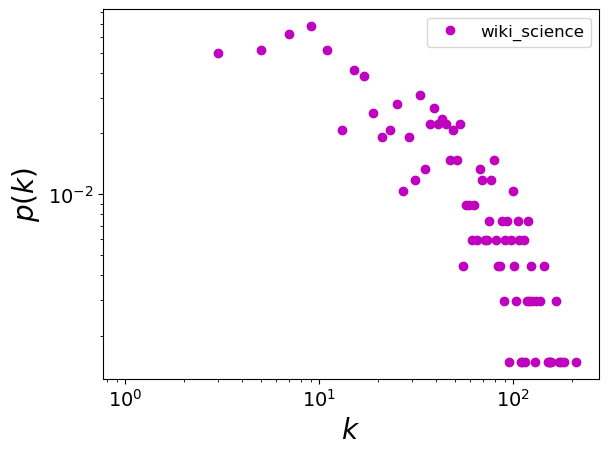

In [8]:


plt.loglog(k_graus, p_k_rede, 'mo', label = 'wiki_science')


plt.xlabel('$k$', fontsize = 20)
plt.ylabel('$p(k)$', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.legend(frameon = True, fontsize = 12)
plt.show()

In [9]:
# Criar o grafo diretamente a partir da lista de arestas
G_rede = nx.Graph()
G_rede.add_edges_from(rede_full)


# Calculando o grau de cada nó
degree_dict = dict(G_rede.degree())

# Escalando o tamanho do nó de acordo com o grau
node_sizes = [degree_dict[node] * 100 for node in G_rede.nodes()]  # Multiplica o grau para escalonar

# Plotando o grafo com tamanhos de nó ajustados ao grau
plt.figure(figsize=(80, 80))
nx.draw(G_rede, with_labels=False, node_size=node_sizes, node_color='darkorange', font_size=8, font_color='black')
plt.show()






In [10]:

# Criar o grafo diretamente a partir da lista de arestas
G_rede = nx.Graph()
G_rede.add_edges_from(rede_full)

# Verificar se o grafo é conectado
if nx.is_connected(G_rede):
    # Calcular a menor distância média
    avg_shortest_path = nx.average_shortest_path_length(G_rede)
    print(f"A menor distância média no grafo é: {avg_shortest_path}")
else:
    print("O grafo não é conectado.")

A menor distância média no grafo é: 3.4333379948082823


In [11]:
# Calcular o coeficiente de agrupamento médio
average_clustering = nx.average_clustering(G_rede)
print(f"\nCoeficiente de agrupamento médio do grafo: {average_clustering}")


Coeficiente de agrupamento médio do grafo: 0.5381024992660426


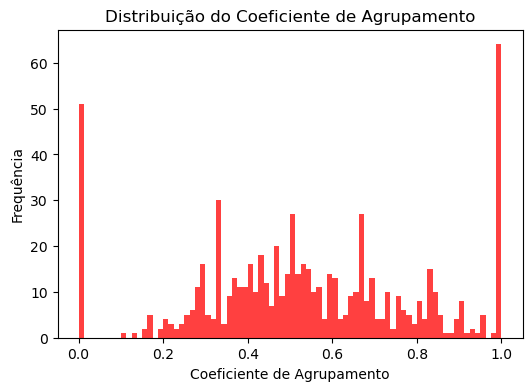

In [12]:
# Coeficiente de aglomeração para cada nó
clustering_coeffs = nx.clustering(G_rede)

# Distribuição do coeficiente de aglomeração
plt.figure(figsize=(6, 4))
plt.hist(clustering_coeffs.values(), bins=80, density=False, alpha=0.75, color='red')
plt.title("Distribuição do Coeficiente de Agrupamento")
plt.xlabel("Coeficiente de Agrupamento")
plt.ylabel("Frequência")
plt.show()

In [13]:
diameter = nx.diameter(G_rede)
print(f'Diâmetro da Rede: {diameter}')

Diâmetro da Rede: 9
